In [1]:
 ####### Setup
import os
import itertools
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.tri import Triangulation
from matplotlib.patches import Patch
from matplotlib.patches import Rectangle
from matplotlib.lines import Line2D
from matplotlib.offsetbox import OffsetImage,AnnotationBbox,TextArea
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cv2
from scipy import stats
from sklearn.linear_model import LinearRegression
from sklearn import preprocessing
while os.getcwd().split('\\')[-1] != 'ecological-networks':
    %cd ..
import setup_paths
setup_paths.add_path()
from Species_Reintroductions import *
global DATA_TYPE
DATA_TYPE = 'Real_2D'
CASE_TO_SOLVE_init(DATA_TYPE)
get_CASE()

def CASE_init(CASE_TO_SOLVE):
    DATA_TYPE = CASE_TO_SOLVE
    CASE_TO_SOLVE_init(DATA_TYPE)
    NetworkName_Solved_df = UnpickleObj(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '01_Simulation_Execution', f"Network_Solved_{DATA_TYPE.split('_')[0]}.pkl"))
    M = UnpickleObj(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '01_Simulation_Execution', f"M_{DATA_TYPE.split('_')[0]}.pkl"))
    if DATA_TYPE.split('_')[0] == 'Syn':
        M = {k:M[k] for k in M.keys() if int(k.split('_')[2]) == 100}
    return DATA_TYPE, NetworkName_Solved_df, M

def init_HeatmapData(Case, Start = 0, End = -1):
    if End == -1:
        End = Start + 1
    if Case == 1:
        Heatmap01_All = UnpickleObj(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '02_Generate_Database', f"Heatmap01_{DATA_TYPE}.pkl"))
        return {k:Heatmap01_All[k][Start:End] for k in Heatmap01_All.keys()}
    if Case == 2:
        Heatmap02_All = UnpickleObj(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '02_Generate_Database', f"Heatmap02_{DATA_TYPE}.pkl"))
        return {k:Heatmap02_All[k][Start:End] for k in Heatmap02_All.keys()}
    if Case == 3:
        Heatmap03_All = UnpickleObj(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '02_Generate_Database', f"Heatmap03_{DATA_TYPE}.pkl"))
        return {k:Heatmap03_All[k][Start:End] for k in Heatmap03_All.keys()}

d:\Github\ecological-networks\Code\01_Species_Reintroductions
d:\Github\ecological-networks\Code
d:\Github\ecological-networks
Real_2D


In [2]:
M = UnpickleObj(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '01_Simulation_Execution', f"M_Real.pkl"))
M.keys()

dict_keys(['M_PL_003', 'M_PL_022', 'M_PL_060_04', 'M_PL_060_07', 'M_PL_060_06', 'M_PL_040', 'M_PL_041', 'M_PL_030', 'M_PL_012', 'M_PL_060_05', 'M_PL_072_04', 'M_PL_023', 'M_PL_072_02', 'M_PL_031', 'M_PL_035', 'M_PL_017', 'M_PL_072_01', 'M_PL_010', 'M_PL_002', 'M_PL_043', 'M_PL_014', 'M_PL_058', 'M_PL_072_03', 'M_PL_019', 'M_PL_009', 'M_PL_018', 'M_PL_034', 'M_PL_026', 'M_PL_029', 'M_PL_028'])

In [3]:
# NetM = getNetDefinitions(M['M_PL_041'])
M_df = M['M_PL_041']
X = np.array(M_df)
NestednessCalculator(X).nodf(X)

0.27348225199102394

In [4]:
sequences = {}
for key in [(0, 2, 0), (0, 5, 0), (0, 8, 0), (1, 2, 0), (1, 5, 0), (1, 8, 0), (2, 2, 0), (2, 5, 0), (2, 8, 0)]:
    sequences[key] = []
    for ensemble in range(10):
        sample_network_file = UnpickleObj(rf"E:\home\Archive_Incomplete\Ecology\sarth_documents\Ecological_Restoration_04\Real_Data\M_PL_041\M_PL_041-Data_four_{key}_{ensemble}_0.pkl")
        sequences[key].append(sample_network_file[0])

In [ ]:
sample_network_perturbed = UnpickleObj(rf"E:\home\Archive_Incomplete\Ecology\sarth_documents\Ecological_Restoration_04\Real_Data\M_PL_041\M_PL_041-Data_two.pkl")
sample_network_perturbed[(0,2,0)]

In [30]:
# M_df = M_df.drop(labels = Node_del, axis = axis)


In [29]:
sequences[(0,2,0)]

[['A13', 'A10', 'A2', 'A17', 'A11', 'A22', 'A27', 'A29', 'A25'],
 ['A3', 'A10', 'A20', 'A18', 'A21', 'A19', 'A22', 'A27', 'A23'],
 ['A0', 'A1', 'A9', 'A12', 'A20', 'A28', 'A26', 'A16', 'A24'],
 ['A5', 'A15', 'A17', 'A2', 'A20', 'A22', 'A14', 'A16', 'A27'],
 ['A15', 'A2', 'A11', 'A22', 'A19', 'A21', 'A30', 'A27', 'A16'],
 ['A10', 'A13', 'A17', 'A2', 'A27', 'A24', 'A29', 'A30', 'A23'],
 ['A0', 'A5', 'A7', 'A6', 'A22', 'A19', 'A28', 'A23', 'A29'],
 ['A5', 'A1', 'A9', 'A2', 'A18', 'A11', 'A28', 'A26', 'A30'],
 ['A0', 'A7', 'A1', 'A15', 'A4', 'A18', 'A26', 'A30', 'A23'],
 ['A5', 'A7', 'A3', 'A9', 'A11', 'A4', 'A18', 'A19', 'A23']]

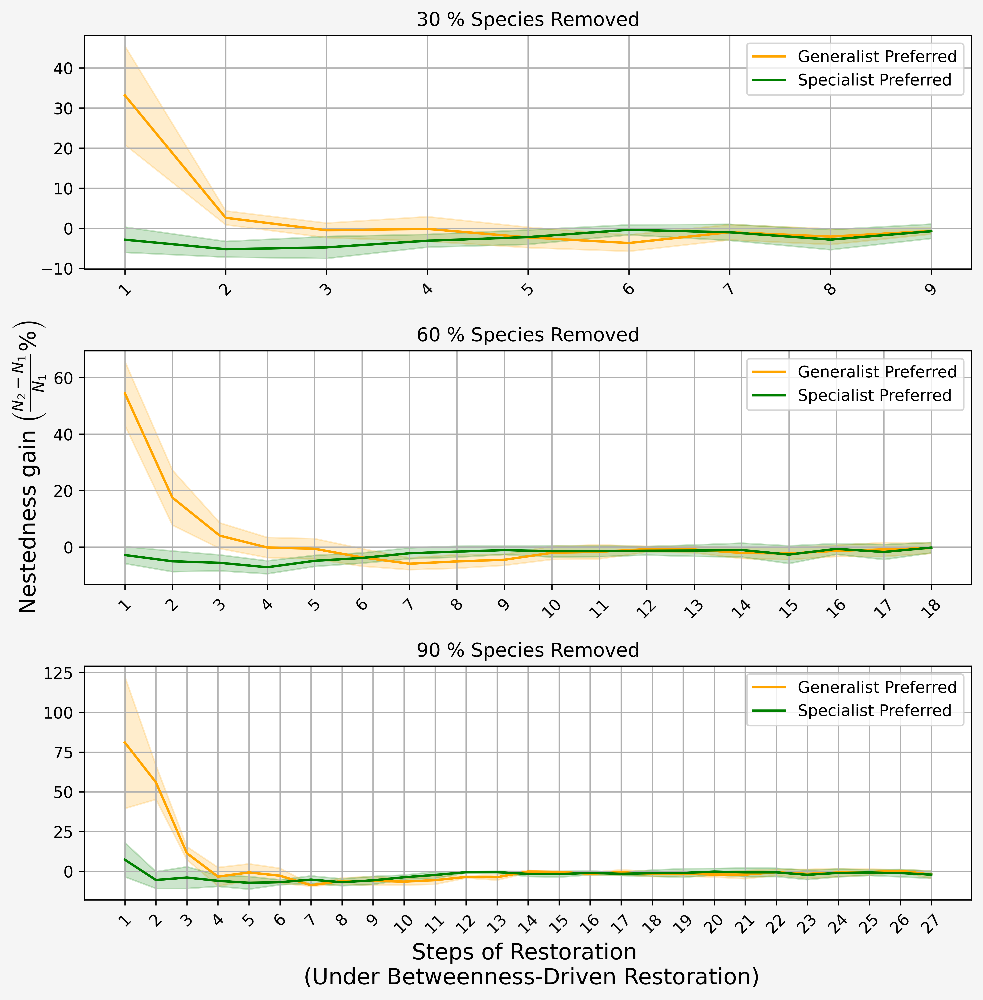

In [100]:
sequences = {}
for key in [(0, 2, 0), (0, 5, 0), (0, 8, 0), (1, 2, 0), (1, 5, 0), (1, 8, 0), (2, 2, 0), (2, 5, 0), (2, 8, 0)]:
    sequences[key] = []
    for ensemble in range(10):
        sample_network_file = UnpickleObj(rf"E:\home\Archive_Incomplete\Ecology\sarth_documents\Ecological_Restoration_04\Real_Data\M_PL_041\M_PL_041-Data_six_{key}_{ensemble}_0.pkl")
        sequences[key].append(sample_network_file[0])

fig, ax = plt.subplots(3,1, figsize = (10,10), dpi = 600, facecolor = 'whitesmoke')
fig.subplots_adjust(hspace = 0.35)
row = 0
for P in [2, 5, 8]:
    Data = {}
    c = {0: 'blue', 1: 'orange', 2: 'green'}
    labels = {0: 'Random Perturbation', 1: 'Generalist Preferred', 2: 'Specialist Preferred'}
    for S in [1,2]:#[0,1,2]:
        Data[S] = []
        for seq in itertools.islice(sequences[(S,P,0)],0,None,1):
            M_per = M_df.drop(labels = seq, axis = 0)
            # print(M_per.shape)
            M_per = M_per.loc[(M_per!=0).any(axis=1)] #Cleaning Row isoloates
            M_per = M_per.loc[:, (M_per!=0).any(axis=0)] #Cleaning Column isoloates
            # print(M_per.shape)
            # print(NestednessCalculator(np.array(M_per)).nodf(np.array(M_per)))
            N_prev = NestednessCalculator(np.array(M_per)).nodf(np.array(M_per))
            temp = []
            for idx, species in enumerate(seq):
                M_per = M_per.append(M_df.loc[species])
                M_per[M_per.isnull()] = M_df
                M_per = M_per.loc[(M_per!=0).any(axis=1)] #Cleaning Row isoloates
                M_per = M_per.loc[:, (M_per!=0).any(axis=0)] #Cleaning Column isoloates
                N_new = NestednessCalculator(np.array(M_per)).nodf(np.array(M_per))
                temp.append(((N_new - N_prev) / N_new)*100)
                N_prev = N_new
            Data[S].append(temp)
        ax[row].plot(
            np.mean(np.array(Data[S]), axis = 0), 
            label = labels[S], 
            c = c[S]
            )
        ax[row].fill_between(
            np.arange(np.array(Data[S]).shape[1]), 
            np.mean(np.array(Data[S]), axis = 0) - np.std(np.array(Data[S]), axis = 0), 
            np.mean(np.array(Data[S]), axis = 0) + np.std(np.array(Data[S]), axis = 0), 
            alpha = 0.2, color = c[S]
            )
    ax[row].grid()
    ax[row].legend()
    ax[row].set_title(rf"{P+1}0 % Species Removed", fontsize = 12)
    ax[row].set_xticks(np.arange(np.array(Data[S]).shape[1]))
    ax[row].set_xticklabels(np.arange(1,np.array(Data[S]).shape[1]+1), rotation = 45, fontsize = 10)
    row += 1
ax[2].set_xlabel("Steps of Restoration \n (Under Betweenness-Driven Restoration)", fontsize = 14)
ax[1].set_ylabel(r"Nestedness gain $\left( \frac{N_2 - N_1}{N_1} \% \right)$", fontsize = 14)
# ax[-1].set_ylim(-100, 100)
fig.set_facecolor('whitesmoke')
plt.show()


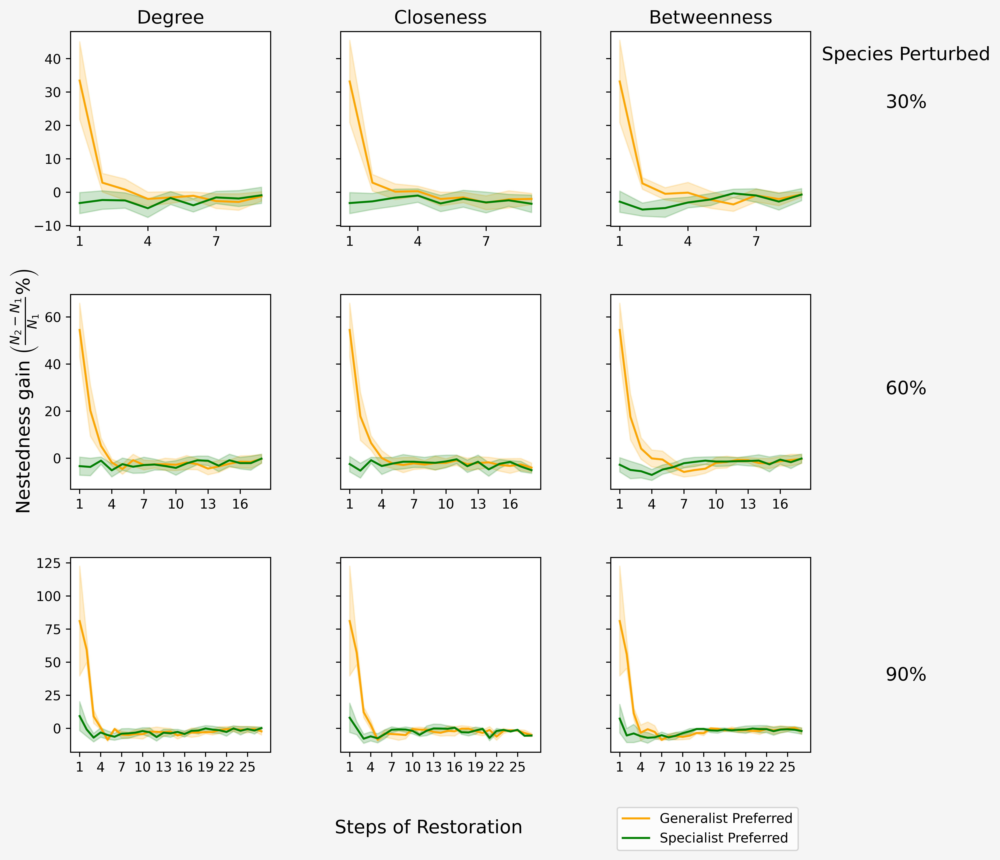

In [5]:
fig, ax = plt.subplots(3,3, figsize = (10,10), dpi = 600, facecolor = 'whitesmoke', sharey='row')
fig.subplots_adjust(hspace = 0.35, wspace = 0.35)

for col, (strategy_id, strategy_name) in enumerate(zip(['four', 'five', 'six'], ['degree', 'closeness', 'betweenness'])):
    sequences = {}
    for key in [(0, 2, 0), (0, 5, 0), (0, 8, 0), (1, 2, 0), (1, 5, 0), (1, 8, 0), (2, 2, 0), (2, 5, 0), (2, 8, 0)]:
        sequences[key] = []
        for ensemble in range(10):
            sample_network_file = UnpickleObj(rf"E:\home\Archive_Incomplete\Ecology\sarth_documents\Ecological_Restoration_04\Real_Data\M_PL_041\M_PL_041-Data_{strategy_id}_{key}_{ensemble}_0.pkl")
            sequences[key].append(sample_network_file[0])

    row = 0
    for P in [2, 5, 8]:
        Data = {}
        c = {0: 'blue', 1: 'orange', 2: 'green'}
        labels = {0: 'Random Perturbation', 1: 'Generalist Preferred', 2: 'Specialist Preferred'}
        for S in [1,2]:#[0,1,2]:
            Data[S] = []
            for seq in itertools.islice(sequences[(S,P,0)],0,None,1):
                M_per = M_df.drop(labels = seq, axis = 0)
                # print(M_per.shape)
                M_per = M_per.loc[(M_per!=0).any(axis=1)] #Cleaning Row isoloates
                M_per = M_per.loc[:, (M_per!=0).any(axis=0)] #Cleaning Column isoloates
                # print(M_per.shape)
                # print(NestednessCalculator(np.array(M_per)).nodf(np.array(M_per)))
                N_prev = NestednessCalculator(np.array(M_per)).nodf(np.array(M_per))
                temp = []
                for idx, species in enumerate(seq):
                    M_per = M_per.append(M_df.loc[species])
                    M_per[M_per.isnull()] = M_df
                    M_per = M_per.loc[(M_per!=0).any(axis=1)] #Cleaning Row isoloates
                    M_per = M_per.loc[:, (M_per!=0).any(axis=0)] #Cleaning Column isoloates
                    N_new = NestednessCalculator(np.array(M_per)).nodf(np.array(M_per))
                    temp.append(((N_new - N_prev) / N_new)*100)
                    N_prev = N_new
                Data[S].append(temp)
            ax[row, col].plot(
                np.mean(np.array(Data[S]), axis = 0), 
                label = labels[S], 
                c = c[S]
                )
            ax[row, col].fill_between(
                np.arange(np.array(Data[S]).shape[1]), 
                np.mean(np.array(Data[S]), axis = 0) - np.std(np.array(Data[S]), axis = 0), 
                np.mean(np.array(Data[S]), axis = 0) + np.std(np.array(Data[S]), axis = 0), 
                alpha = 0.2, color = c[S]
                )
        # ax[row, col].grid()

        # ax[row, 1].set_title(rf"{P+1}0 % Species Removed", fontsize = 12)
        ax[row, col].set_xticks(np.arange(np.array(Data[S]).shape[1])[::3])
        ax[row, col].set_xticklabels(np.arange(1,np.array(Data[S]).shape[1]+1)[::3], fontsize = 10)
        row += 1
    # ax[2].set_xlabel(f"Steps of Restoration \n (Under {strategy_name}-Driven Restoration)", fontsize = 14)
    ax[1, 0].set_ylabel(r"Nestedness gain $\left( \frac{N_2 - N_1}{N_1} \% \right)$", fontsize = 14)

fig.text(0.5, 0.04, 'Steps of Restoration', ha='center', fontsize = 14)

ax[0, 0].set_title('Degree', fontsize = 14)
ax[0, 1].set_title('Closeness', fontsize = 14)
ax[0, 2].set_title('Betweenness', fontsize = 14)

fig.text(1.00, 0.85, 'Species Perturbed', ha='center', fontsize = 14)
fig.text(1.00, 0.80, '30%', ha='center', fontsize = 14)
fig.text(1.00, 0.5, '60%', ha='center', fontsize = 14)
fig.text(1.00, 0.2, '90%', ha='center', fontsize = 14)

ax[2, 2].legend(bbox_to_anchor=(0.0, -0.25), loc='upper left')
fig.set_facecolor('whitesmoke')
plt.show()

In [8]:
np.random.choice(list(M.keys()), 5, replace = False)

array(['M_PL_026', 'M_PL_009', 'M_PL_058', 'M_PL_002', 'M_PL_072_03'],
      dtype='<U11')

M_PL_026


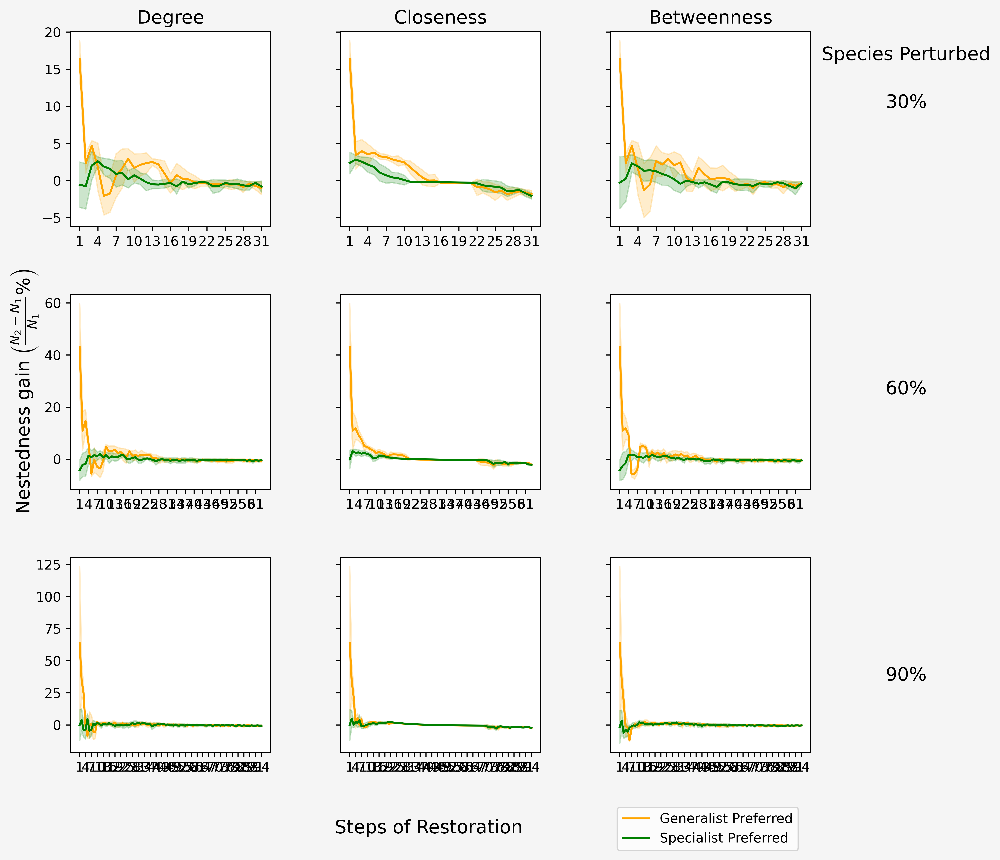

M_PL_009


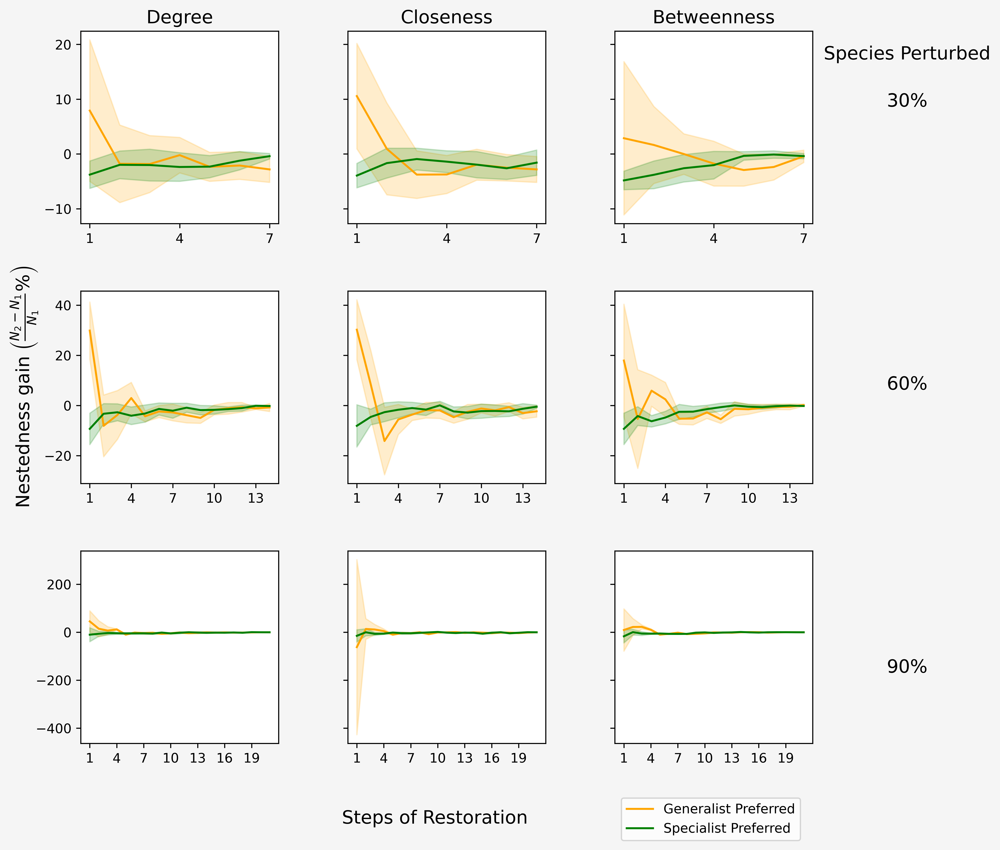

M_PL_058


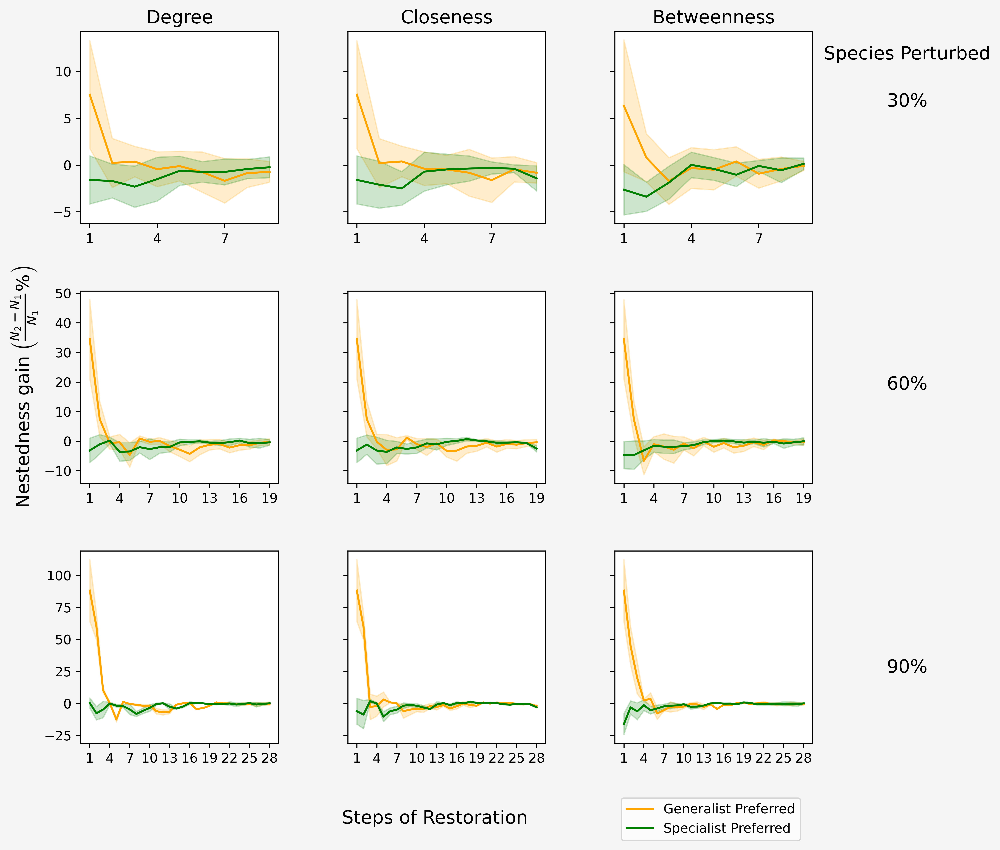

M_PL_002


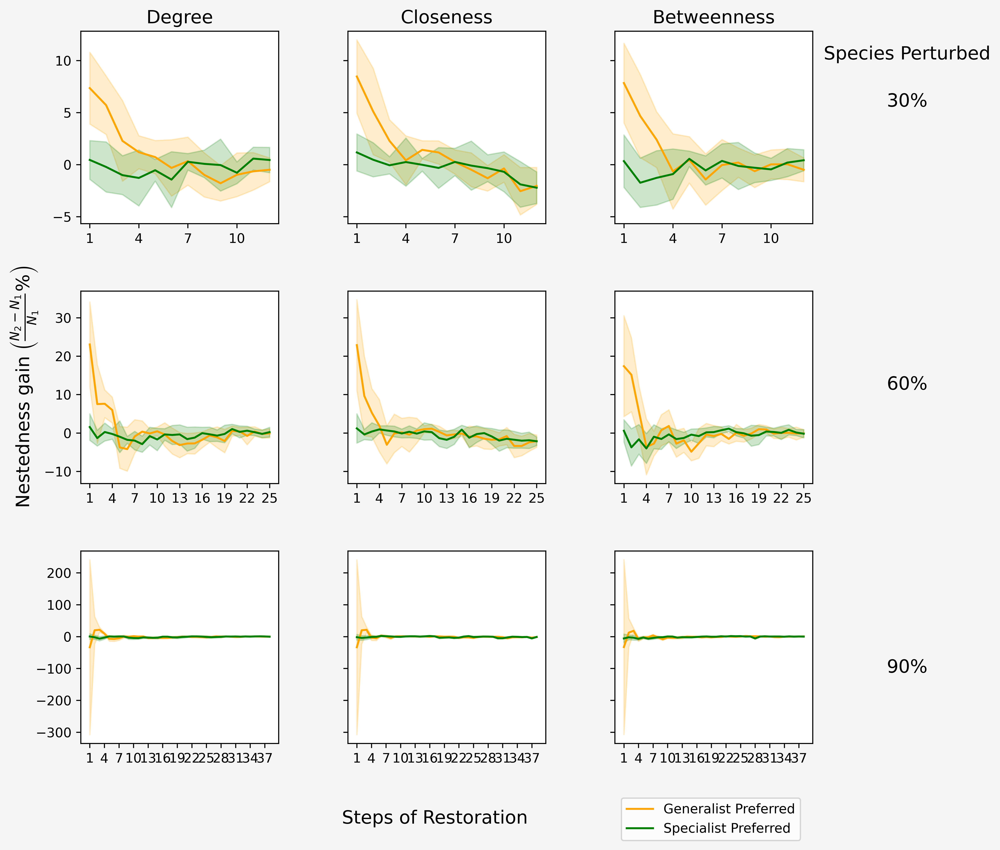

M_PL_072_03


C:\Users\sarth\AppData\Roaming\Python\Python36\site-packages\ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in double_scalars
C:\Users\sarth\AppData\Roaming\Python\Python36\site-packages\ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in double_scalars
C:\Users\sarth\AppData\Roaming\Python\Python36\site-packages\ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in double_scalars


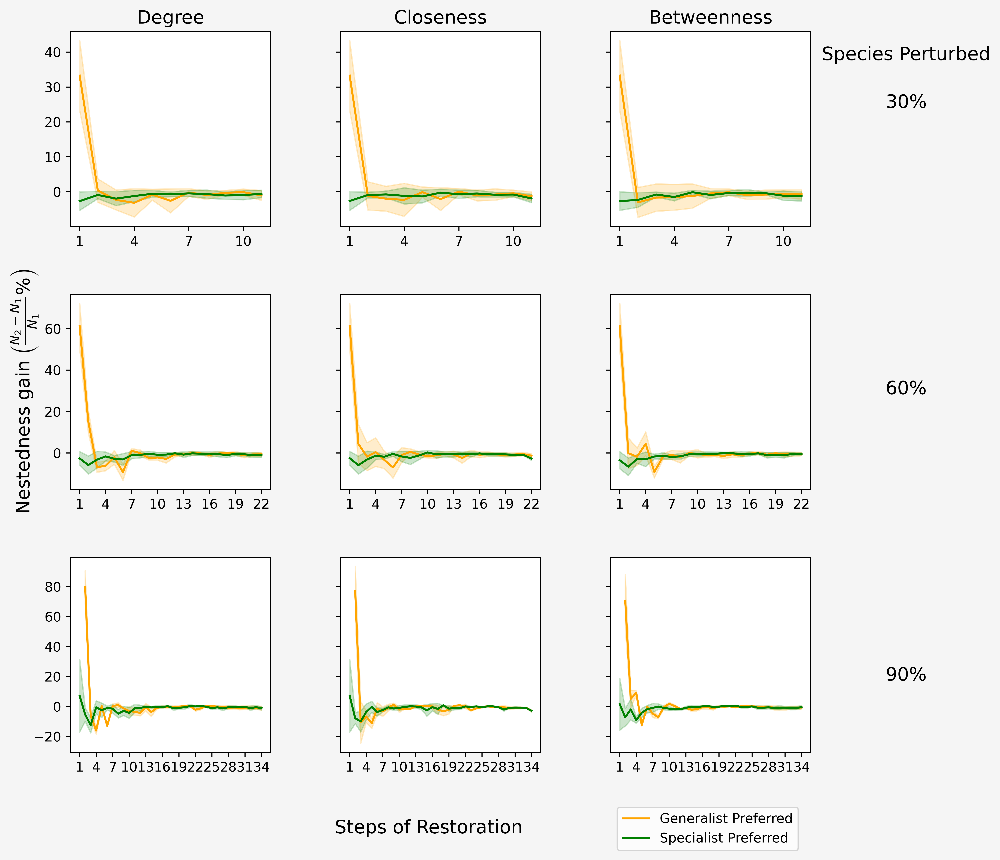

In [10]:
for NetworkName in ['M_PL_026', 'M_PL_009', 'M_PL_058', 'M_PL_002', 'M_PL_072_03']:
    print(NetworkName)
    M_df = M[NetworkName]
    fig, ax = plt.subplots(3,3, figsize = (10,10), dpi = 600, facecolor = 'whitesmoke', sharey='row')
    fig.subplots_adjust(hspace = 0.35, wspace = 0.35)

    for col, (strategy_id, strategy_name) in enumerate(zip(['four', 'five', 'six'], ['degree', 'closeness', 'betweenness'])):
        sequences = {}
        for key in [(0, 2, 0), (0, 5, 0), (0, 8, 0), (1, 2, 0), (1, 5, 0), (1, 8, 0), (2, 2, 0), (2, 5, 0), (2, 8, 0)]:
            sequences[key] = []
            for ensemble in range(10):
                sample_network_file = UnpickleObj(rf"E:\home\Archive_Incomplete\Ecology\sarth_documents\Ecological_Restoration_04\Real_Data\{NetworkName}\{NetworkName}-Data_{strategy_id}_{key}_{ensemble}_0.pkl")
                sequences[key].append(sample_network_file[0])

        row = 0
        for P in [2, 5, 8]:
            Data = {}
            c = {0: 'blue', 1: 'orange', 2: 'green'}
            labels = {0: 'Random Perturbation', 1: 'Generalist Preferred', 2: 'Specialist Preferred'}
            for S in [1,2]:#[0,1,2]:
                Data[S] = []
                for seq in itertools.islice(sequences[(S,P,0)],0,None,1):
                    M_per = M_df.drop(labels = seq, axis = 0)
                    # print(M_per.shape)
                    M_per = M_per.loc[(M_per!=0).any(axis=1)] #Cleaning Row isoloates
                    M_per = M_per.loc[:, (M_per!=0).any(axis=0)] #Cleaning Column isoloates
                    # print(M_per.shape)
                    # print(NestednessCalculator(np.array(M_per)).nodf(np.array(M_per)))
                    N_prev = NestednessCalculator(np.array(M_per)).nodf(np.array(M_per))
                    temp = []
                    for idx, species in enumerate(seq):
                        M_per = M_per.append(M_df.loc[species])
                        M_per[M_per.isnull()] = M_df
                        M_per = M_per.loc[(M_per!=0).any(axis=1)] #Cleaning Row isoloates
                        M_per = M_per.loc[:, (M_per!=0).any(axis=0)] #Cleaning Column isoloates
                        N_new = NestednessCalculator(np.array(M_per)).nodf(np.array(M_per))
                        temp.append(((N_new - N_prev) / N_new)*100)
                        N_prev = N_new
                    Data[S].append(temp)
                ax[row, col].plot(
                    np.mean(np.array(Data[S]), axis = 0), 
                    label = labels[S], 
                    c = c[S]
                    )
                ax[row, col].fill_between(
                    np.arange(np.array(Data[S]).shape[1]), 
                    np.mean(np.array(Data[S]), axis = 0) - np.std(np.array(Data[S]), axis = 0), 
                    np.mean(np.array(Data[S]), axis = 0) + np.std(np.array(Data[S]), axis = 0), 
                    alpha = 0.2, color = c[S]
                    )
            # ax[row, col].grid()

            # ax[row, 1].set_title(rf"{P+1}0 % Species Removed", fontsize = 12)
            ax[row, col].set_xticks(np.arange(np.array(Data[S]).shape[1])[::3])
            ax[row, col].set_xticklabels(np.arange(1,np.array(Data[S]).shape[1]+1)[::3], fontsize = 10)
            row += 1
        # ax[2].set_xlabel(f"Steps of Restoration \n (Under {strategy_name}-Driven Restoration)", fontsize = 14)
        ax[1, 0].set_ylabel(r"Nestedness gain $\left( \frac{N_2 - N_1}{N_1} \% \right)$", fontsize = 14)

    fig.text(0.5, 0.04, 'Steps of Restoration', ha='center', fontsize = 14)

    ax[0, 0].set_title('Degree', fontsize = 14)
    ax[0, 1].set_title('Closeness', fontsize = 14)
    ax[0, 2].set_title('Betweenness', fontsize = 14)

    fig.text(1.00, 0.85, 'Species Perturbed', ha='center', fontsize = 14)
    fig.text(1.00, 0.80, '30%', ha='center', fontsize = 14)
    fig.text(1.00, 0.5, '60%', ha='center', fontsize = 14)
    fig.text(1.00, 0.2, '90%', ha='center', fontsize = 14)

    ax[2, 2].legend(bbox_to_anchor=(0.0, -0.25), loc='upper left')
    fig.set_facecolor('whitesmoke')
    plt.show()